
🔍 Gatunek: barrel_jellyfish | Zdjęcie: rotated_10_aug-78-46.jpg


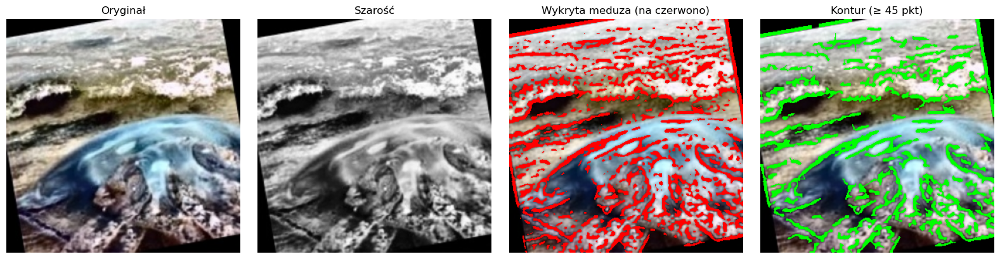


🔍 Gatunek: blue_jellyfish | Zdjęcie: rotated_25_aug-15-25.jpg


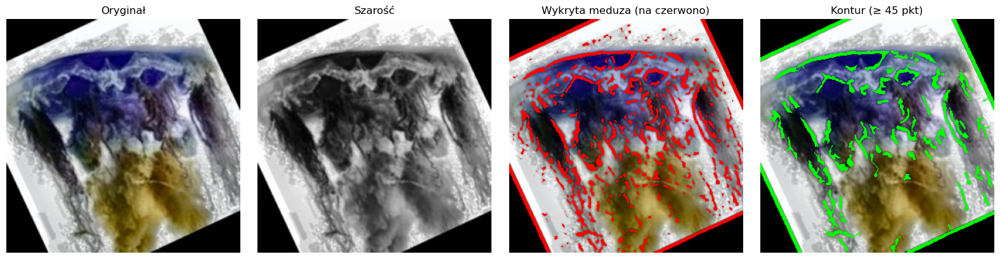


🔍 Gatunek: compass_jellyfish | Zdjęcie: rotated_5_34.jpg


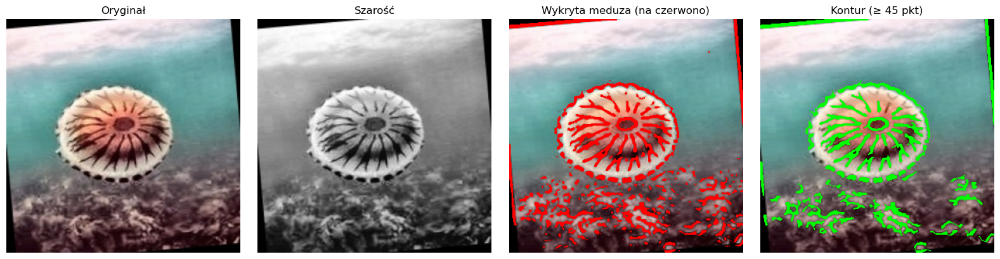


🔍 Gatunek: lions_mane_jellyfish | Zdjęcie: rotated_25_aug-69-09.jpg


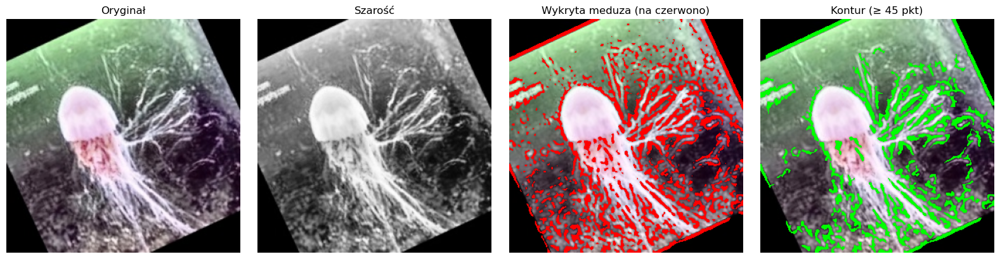


🔍 Gatunek: mauve_stinger_jellyfish | Zdjęcie: rotated_5_aug-42-52.jpg


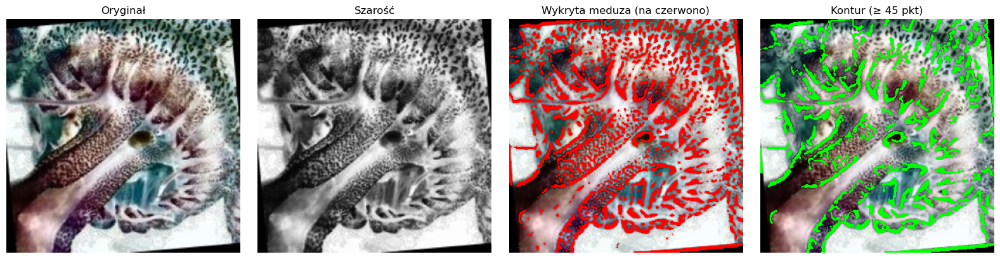


🔍 Gatunek: Moon_jellyfish | Zdjęcie: rotated_20_aug-28-38.jpg


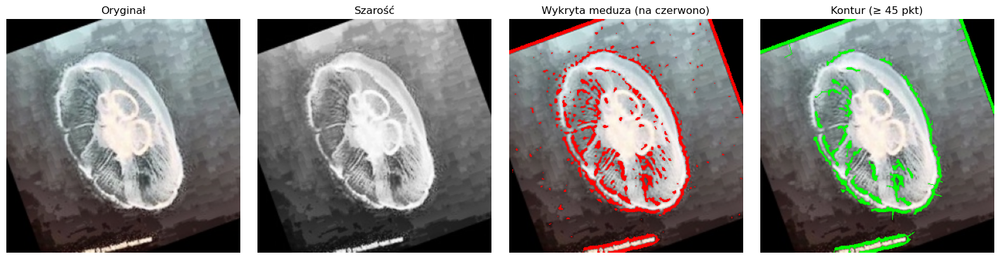

In [1]:
#WIZUALIZACJA MEDUZ 1
#Oryginalny obraz.
#Wersja w odcieniach szarości.
#Obraz z wykrytą meduzą na czerwono.
#Obraz z konturami wykrytej grupy punktów (potencjalnej meduzy).

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Ścieżka do folderu treningowego
BASE_DIR = "DATA\Rotated_Klasteryzacja\Train"

# Prawidłowe nazwy folderów z gatunkami meduz
jellyfish_species = [
    "barrel_jellyfish",
    "blue_jellyfish",
    "compass_jellyfish",
    "lions_mane_jellyfish",
    "mauve_stinger_jellyfish",
    "Moon_jellyfish"
]

from sklearn.neighbors import NearestNeighbors
from collections import defaultdict, deque

def segment_jellyfish_region(image_path, max_distance=15, min_group_size=45):
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, (300, 300))

    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray)
    blurred = cv2.GaussianBlur(equalized, (7, 7), 0)

    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV,
                                   11, 6)

    highlighted = img_resized.copy()
    highlighted[thresh > 0] = [0, 0, 255]

    contour_overlay = img_resized.copy()
    points = np.column_stack(np.where(thresh > 0))  # (y, x)

    if len(points) > 2:
        points_xy = np.fliplr(points)  # (x, y)

        # Połączenia sąsiadów (graf)
        nbrs = NearestNeighbors(n_neighbors=3, algorithm='auto').fit(points_xy)
        distances, indices = nbrs.kneighbors(points_xy)

        connections = defaultdict(list)
        for i, (dists, neighbors) in enumerate(zip(distances, indices)):
            for j in range(1, 3):  # najbliżsi 2 sąsiedzi
                if dists[j] < max_distance:
                    connections[i].append(neighbors[j])
                    connections[neighbors[j]].append(i)  # graf nieskierowany

        # Szukamy spójnych grup (BFS)
        visited = set()
        groups = []

        for i in range(len(points_xy)):
            if i in visited:
                continue
            queue = deque([i])
            group = []
            while queue:
                node = queue.popleft()
                if node in visited:
                    continue
                visited.add(node)
                group.append(node)
                for neighbor in connections[node]:
                    if neighbor not in visited:
                        queue.append(neighbor)
            if len(group) >= min_group_size:
                groups.append(group)

        # Rysowanie tylko dużych grup
        for group in groups:
            for i in group:
                for j in connections[i]:
                    if j in group:
                        pt1 = tuple(points_xy[i])
                        pt2 = tuple(points_xy[j])
                        cv2.line(contour_overlay, pt1, pt2, (0, 255, 0), 1)

    # Wizualizacja
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    axs[0].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Oryginał")
    axs[1].imshow(gray, cmap='gray')
    axs[1].set_title("Szarość")
    axs[2].imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
    axs[2].set_title("Wykryta meduza (na czerwono)")
    axs[3].imshow(cv2.cvtColor(contour_overlay, cv2.COLOR_BGR2RGB))
    axs[3].set_title(f"Kontur (≥ {min_group_size} pkt)")
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()



# ◾ Przykładowe zdjęcie z każdego gatunku
for species in jellyfish_species:
    species_dir = os.path.join(BASE_DIR, species)
    all_images = [f for f in os.listdir(species_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not all_images:
        print(f"⚠️ Brak zdjęć w folderze: {species}")
        continue
    
    image_filename = random.choice(all_images)
    image_path = os.path.join(species_dir, image_filename)

    print(f"\n🔍 Gatunek: {species} | Zdjęcie: {image_filename}")
    segment_jellyfish_region(image_path)

    #WIZUALIZACJA MEDUZ W 4 OKNACH




🔍 Gatunek: barrel_jellyfish | Zdjęcie: rotated_10_aug-50-12.jpg


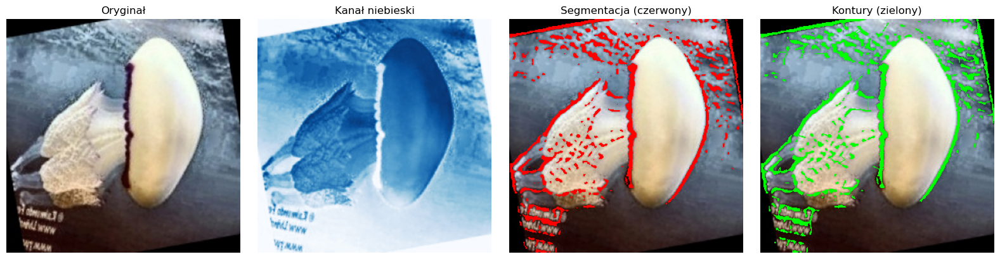


🔍 Gatunek: blue_jellyfish | Zdjęcie: rotated_25_32.jpg


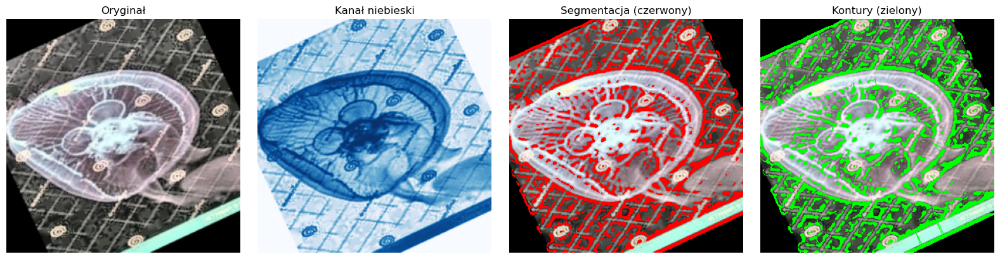


🔍 Gatunek: compass_jellyfish | Zdjęcie: rotated_5_aug-41-53.jpg


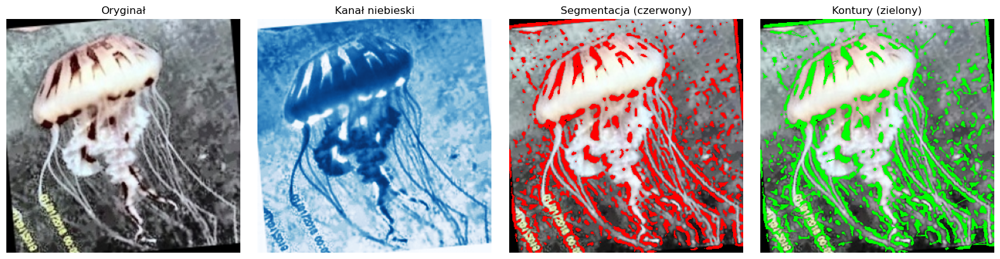


🔍 Gatunek: lions_mane_jellyfish | Zdjęcie: rotated_25_aug-8-09.jpg


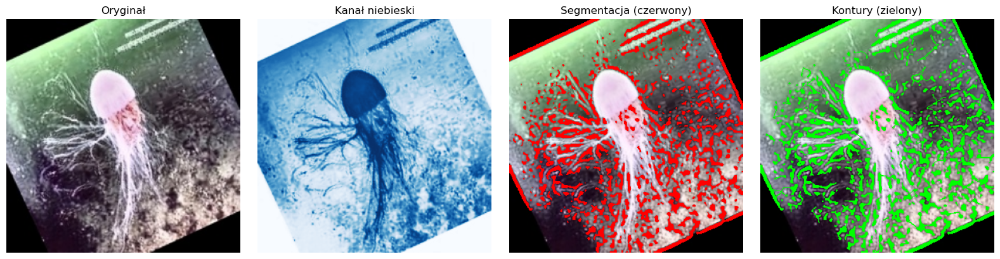


🔍 Gatunek: mauve_stinger_jellyfish | Zdjęcie: rotated_5_62.jpg


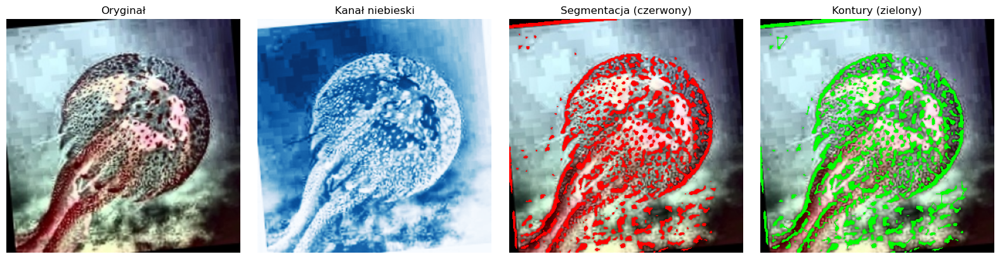


🔍 Gatunek: Moon_jellyfish | Zdjęcie: rotated_15_aug-4-05.jpg


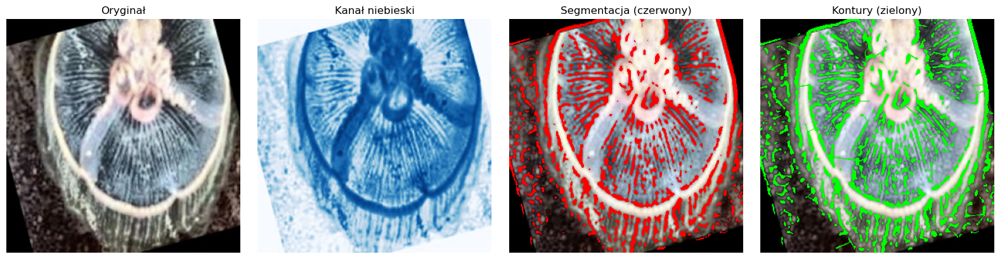

In [2]:
#WIZUALIZACJA MEDUZ 2
#Oryginalny obraz
#Kanał niebieski
#Podświetlenie maski progowania na czerwono
#Kontury zielone

# Zamiast używać skali szarości, używa kanału niebieskiego z obrazu
# bo meduzy często mają przezroczyste lub niebieskawe cechy, więc ten kanał może lepiej je wyłapać.


def segment_jellyfish_region_blue_channel(image_path):
    img = cv2.imread(image_path)
    img_resized = cv2.resize(img, (300, 300))

    # Zamiast skali szarości — użycie kanału niebieskiego
    blue_channel = img_resized[:, :, 0]
    equalized = cv2.equalizeHist(blue_channel)
    blurred = cv2.GaussianBlur(equalized, (9, 9), 0)

    # Adaptacyjne progowanie
    thresh = cv2.adaptiveThreshold(blurred, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV,
                                   11,6)

    # Podświetlenie detekcji na czerwono
    highlighted = img_resized.copy()
    highlighted[thresh > 0] = [0, 0, 255]

    # Dodatkowo: wyznaczenie punktów i konturów jak w Twoim kodzie
    points = np.column_stack(np.where(thresh > 0))
    points = [tuple(p[::-1]) for p in points]  # Zamiana z (y,x) na (x,y)

    # Połączenia punktów
    max_dist = 20
    groups = []
    visited = set()

    for i, pt in enumerate(points):
        if i in visited:
            continue
        group = [pt]
        visited.add(i)
        for j in range(i+1, len(points)):
            if j in visited:
                continue
            dist = np.linalg.norm(np.array(pt) - np.array(points[j]))
            if dist <= max_dist:
                group.append(points[j])
                visited.add(j)
        if len(group) >= 30:  # filtrujemy małe grupki
            groups.append(group)

    # Rysowanie linii między punktami
    contoured = img_resized.copy()
    for group in groups:
        for p in group:
            dists = [(np.linalg.norm(np.array(p) - np.array(q)), q) for q in group if p != q]
            dists.sort()
            for _, q in dists[:2]:  # tylko dwie najbliższe
                if np.linalg.norm(np.array(p) - np.array(q)) <= max_dist:
                    cv2.line(contoured, p, q, (0, 255, 0), 1)

    # Wizualizacja
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))
    axs[0].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Oryginał")
    axs[1].imshow(blue_channel, cmap='Blues')
    axs[1].set_title("Kanał niebieski")
    axs[2].imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
    axs[2].set_title("Segmentacja (czerwony)")
    axs[3].imshow(cv2.cvtColor(contoured, cv2.COLOR_BGR2RGB))
    axs[3].set_title("Kontury (zielony)")
    for ax in axs:
        ax.axis('off')
    plt.tight_layout()
    plt.show()



for species in jellyfish_species:
    species_dir = os.path.join(BASE_DIR, species)
    all_images = [f for f in os.listdir(species_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    if not all_images:
        print(f"⚠️ Brak zdjęć w folderze: {species}")
        continue
    
    image_filename = random.choice(all_images)
    image_path = os.path.join(species_dir, image_filename)

    print(f"\n🔍 Gatunek: {species} | Zdjęcie: {image_filename}")
    segment_jellyfish_region_blue_channel(image_path)


In [20]:
#!pip install ultralytics




image 1/1 c:\Users\66891\ml2_meduzy\DATA\Rotated_Klasteryzacja\Train\barrel_jellyfish\rotated_25_aug-107-32.JPG: 640x640 1 apple, 240.3ms
Speed: 4.4ms preprocess, 240.3ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


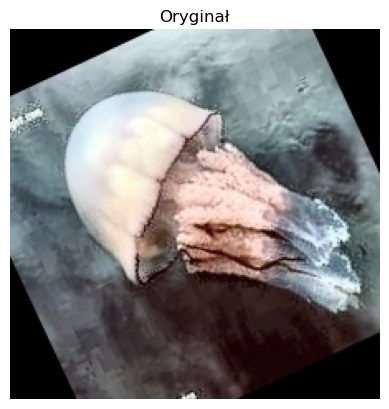

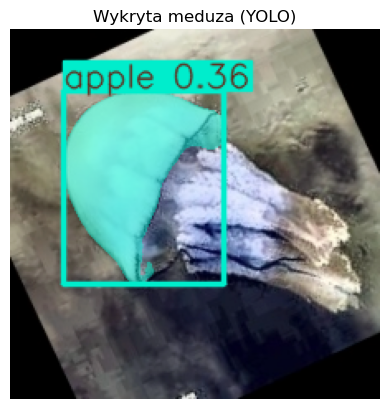

In [19]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

# Załaduj pretrenowany model segmentacyjny
model = YOLO('yolov8s-seg.pt')

# Ścieżka do testowego obrazu
image_path = 'DATA\Rotated_Klasteryzacja\Train\\barrel_jellyfish\\rotated_25_aug-107-32.JPG'
results = model(image_path)

# Pokaż wynik
results[0].plot()
plt.imshow(Image.open(image_path))
plt.title("Oryginał")
plt.axis("off")
plt.show()

plt.imshow(results[0].plot())
plt.title("Wykryta meduza (YOLO)")
plt.axis("off")
plt.show()


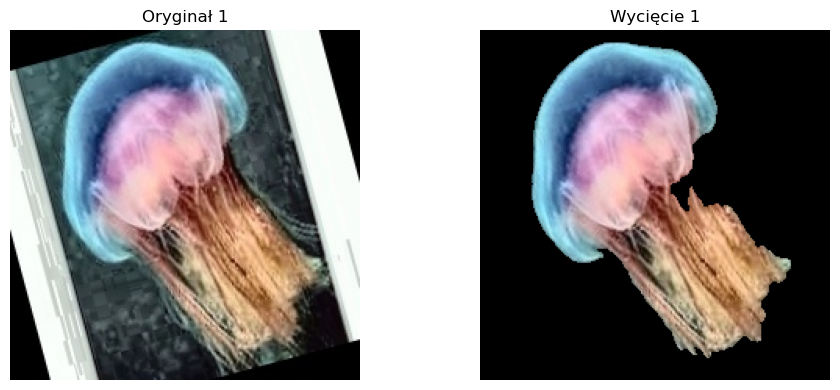

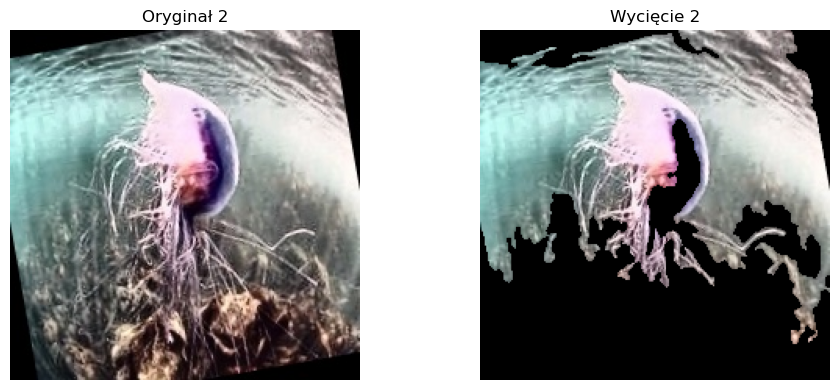

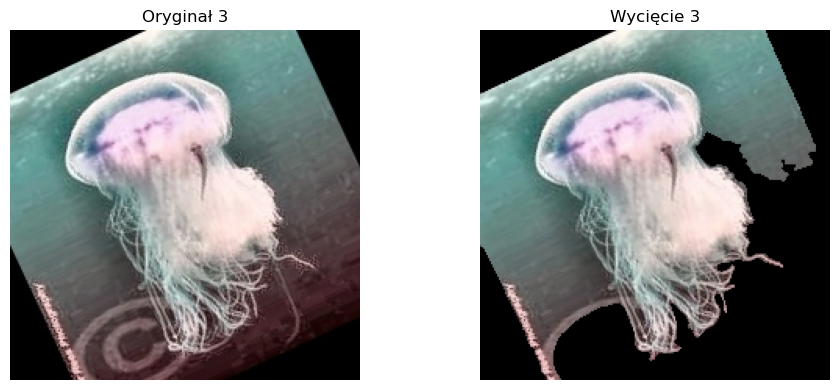

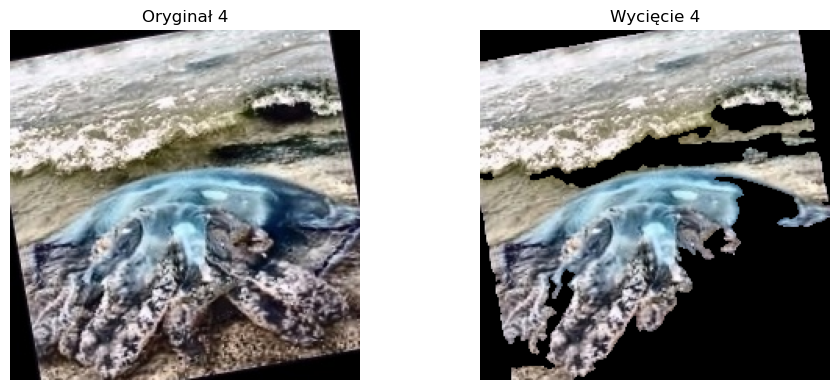

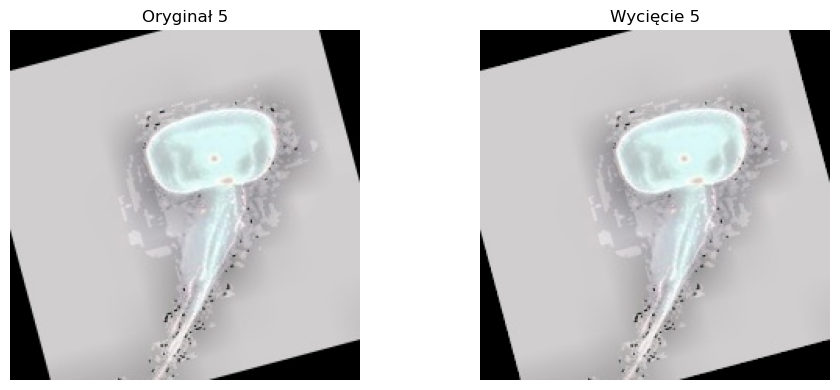

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def cutout_object(image_path, blur_ksize=7, threshold_offset=0):
    # Wczytaj obraz
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Konwersja na szaro i rozmycie
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (blur_ksize, blur_ksize), 0)

    # Binaryzacja Otsu + przesunięcie progu
    otsu_thresh, _ = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    adjusted_thresh = max(0, min(255, int(otsu_thresh + threshold_offset)))
    _, thresh = cv2.threshold(blurred, adjusted_thresh, 255, cv2.THRESH_BINARY)

    # Kontury
    contours, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return image_rgb, image_rgb  # Zwróć oryginał, jeśli brak konturów

    largest_contour = max(contours, key=cv2.contourArea)

    # Maska
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    # Wycięcie
    result = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)
    return image_rgb, result

def get_random_image_paths(root_folder, n=5, extensions={'.jpg', '.jpeg', '.png'}):
    all_images = []
    for dirpath, _, filenames in os.walk(root_folder):
        for file in filenames:
            if os.path.splitext(file)[1].lower() in extensions:
                all_images.append(os.path.join(dirpath, file))
    return random.sample(all_images, min(n, len(all_images)))

# === GŁÓWNY KOD ===

random_images = get_random_image_paths(r'DATA\Rotated_Klasteryzacja\Train', n=5)

for idx, image_path in enumerate(random_images):
    original, cutout = cutout_object(
        image_path,
        blur_ksize=7,          # <- Możesz tuningować (np. 3, 5, 7, 9)
        threshold_offset=-15   # <- Możesz tuningować (-50 ... +50)
    )

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title(f"Oryginał {idx+1}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cutout)
    plt.title(f"Wycięcie {idx+1}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from ipywidgets import interact, IntSlider

# Funkcja wycinająca obiekt
def cutout_object(image_path, blur_ksize=7, threshold_offset=0):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (blur_ksize, blur_ksize), 0)

    otsu_thresh, _ = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    adjusted_thresh = max(0, min(255, int(otsu_thresh + threshold_offset)))
    _, thresh = cv2.threshold(blurred, adjusted_thresh, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return image_rgb, image_rgb

    largest_contour = max(contours, key=cv2.contourArea)
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, [largest_contour], -1, 255, thickness=cv2.FILLED)
    result = cv2.bitwise_and(image_rgb, image_rgb, mask=mask)
    return image_rgb, result

# Wybór jednego losowego zdjęcia
def get_random_image_path(root_folder, extensions={'.jpg', '.jpeg', '.png'}):
    all_images = []
    for dirpath, _, filenames in os.walk(root_folder):
        for file in filenames:
            if os.path.splitext(file)[1].lower() in extensions:
                all_images.append(os.path.join(dirpath, file))
    return random.choice(all_images) if all_images else None

# Interaktywna funkcja
def interactive_cutout(blur_ksize, threshold_offset):
    original, cutout = cutout_object(
        selected_image,
        blur_ksize=blur_ksize,
        threshold_offset=threshold_offset
    )
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Oryginał")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cutout)
    plt.title("Wycięcie")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Ścieżka do folderu treningowego
selected_image = get_random_image_path(r'DATA\Rotated_Klasteryzacja\Train')

# Suwaki interaktywne
interact(
    interactive_cutout,
    blur_ksize=IntSlider(value=7, min=3, max=15, step=2, description='Blur'),
    threshold_offset=IntSlider(value=0, min=-50, max=50, step=1, description='Threshold')
);


interactive(children=(IntSlider(value=7, description='Blur', max=15, min=3, step=2), IntSlider(value=0, descri…

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

def get_dominant_background_color(image_lab, sample_size=10):
    h, w = image_lab.shape[:2]
    samples = []

    # Górny środek
    samples.append(image_lab[0:sample_size, w//2 - sample_size//2 : w//2 + sample_size//2])
    # Dolny środek
    samples.append(image_lab[-sample_size:, w//2 - sample_size//2 : w//2 + sample_size//2])
    # Lewy środek
    samples.append(image_lab[h//2 - sample_size//2 : h//2 + sample_size//2, 0:sample_size])
    # Prawy środek
    samples.append(image_lab[h//2 - sample_size//2 : h//2 + sample_size//2, -sample_size:])

    background = np.concatenate([s.reshape(-1, 3) for s in samples], axis=0)
    mean_color = np.mean(background, axis=0)
    return mean_color


def create_color_distance_mask(image_lab, bg_color, threshold=30):
    diff = np.linalg.norm(image_lab - bg_color, axis=2)
    mask = (diff > threshold).astype(np.uint8) * 255
    return mask

def cutout_by_color_distance(image_path, color_thresh=30):
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)

    # Wykrycie koloru tła
    bg_color = get_dominant_background_color(image_lab)

    # Tworzenie maski na podstawie odległości koloru
    color_mask = create_color_distance_mask(image_lab, bg_color, threshold=color_thresh)

    # (Opcjonalnie) wspomaganie Otsu na jasności
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    _, otsu_mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Łączenie masek
    combined_mask = cv2.bitwise_and(color_mask, otsu_mask)

    # Wybór największego konturu
    contours, _ = cv2.findContours(combined_mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return image_rgb, image_rgb

    largest_contour = max(contours, key=cv2.contourArea)
    object_mask = np.zeros_like(gray)
    cv2.drawContours(object_mask, [largest_contour], -1, 255, thickness=cv2.FILLED)

    result = cv2.bitwise_and(image_rgb, image_rgb, mask=object_mask)
    return image_rgb, result


def cutout_by_center_similarity(image_bgr, threshold=30):
    # Konwersja do LAB (lepsza dla dystansu kolorów)
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
    
    image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)
    
    h, w = image_lab.shape[:2]
    center_size = 10  # rozmiar kwadratu wokół środka
    
    # Pobieramy piksele ze środka
    center_patch = image_lab[
        h//2 - center_size//2 : h//2 + center_size//2,
        w//2 - center_size//2 : w//2 + center_size//2
    ]
    
    center_color = np.mean(center_patch.reshape(-1, 3), axis=0)

    # Obliczamy odległość koloru LAB od koloru ze środka
    dist = np.linalg.norm(image_lab.astype(np.float32) - center_color, axis=2)

    # Maska: zachowaj tylko piksele podobne do środka
    mask = dist < threshold

    # Stwórz obraz z tłem czarnym
    result = np.zeros_like(image_bgr)
    result[mask] = image_bgr[mask]

    return result, mask



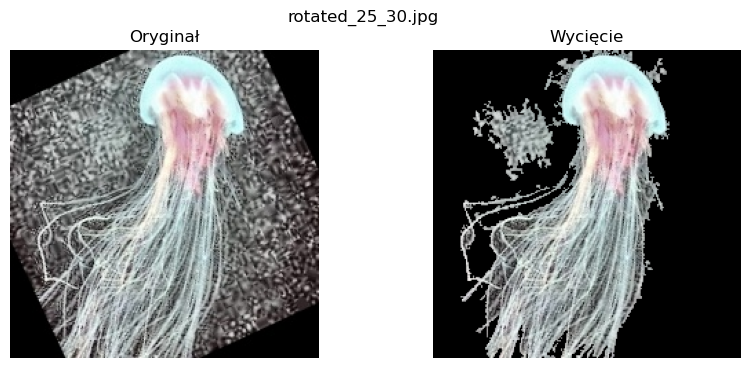

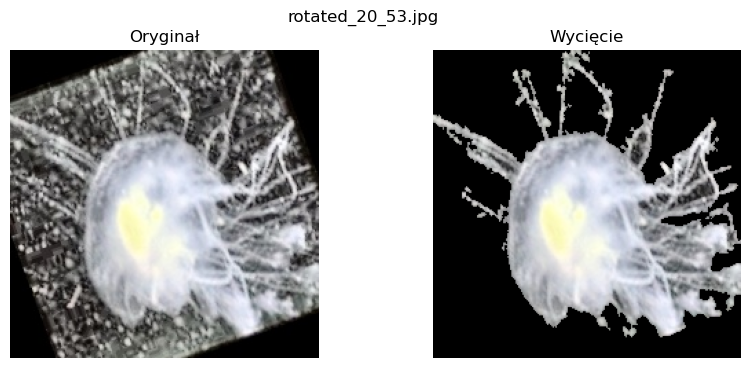

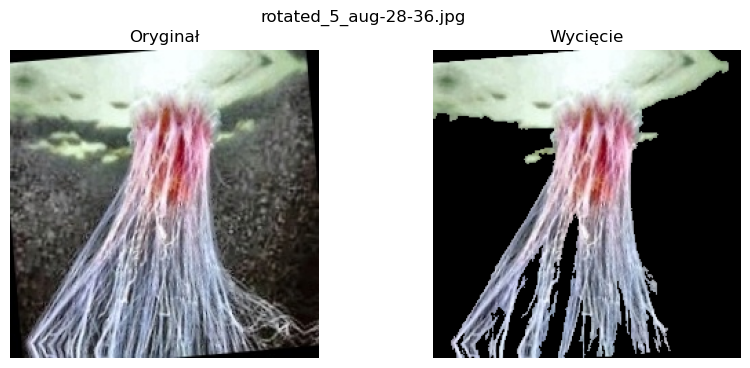

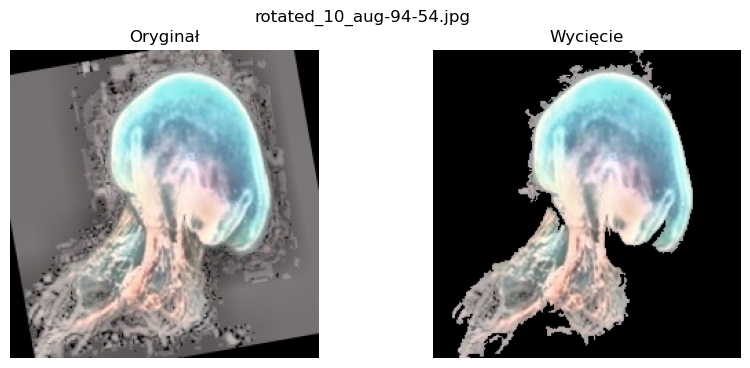

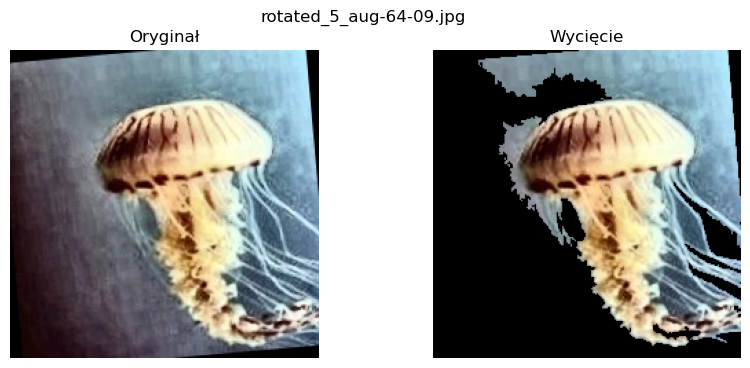

In [68]:
def show_random_cutouts(root_folder, count=5, threshold=30):
    image_paths = []
    for dirpath, _, files in os.walk(root_folder):
        for f in files:
            if f.lower().endswith(('.jpg', '.png', '.jpeg')):
                image_paths.append(os.path.join(dirpath, f))
    selected = random.sample(image_paths, min(count, len(image_paths)))

    for path in selected:
        orig, cut = cutout_by_color_distance(path, color_thresh=threshold)
        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(orig)
        plt.title("Oryginał")
        plt.axis("off")
        plt.subplot(1, 2, 2)
        plt.imshow(cut)
        plt.title("Wycięcie")
        plt.axis("off")
        plt.suptitle(os.path.basename(path))
        plt.show()

# Wywołaj:
show_random_cutouts(r'DATA\Rotated_Klasteryzacja\Train', count=5, threshold=30)


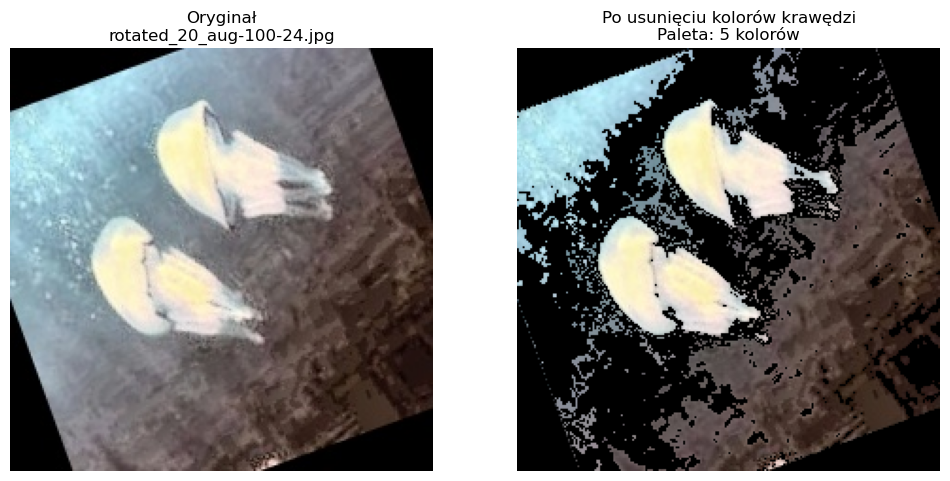

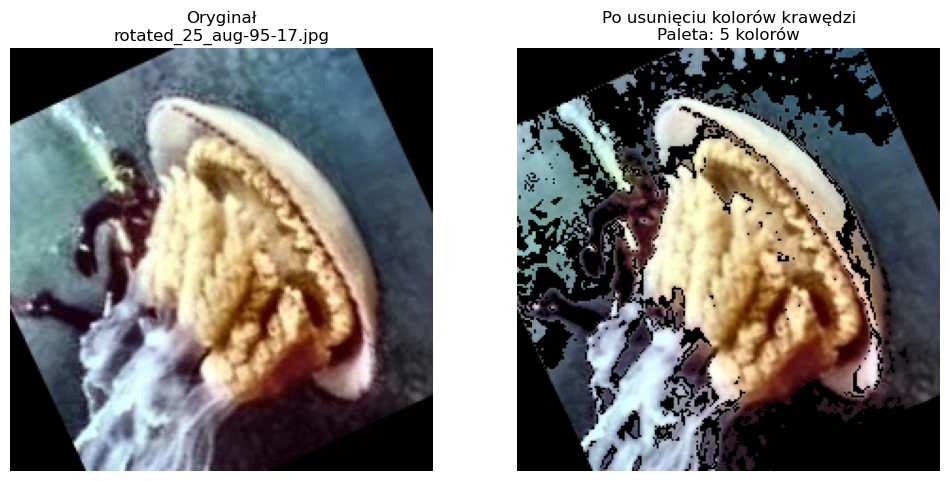

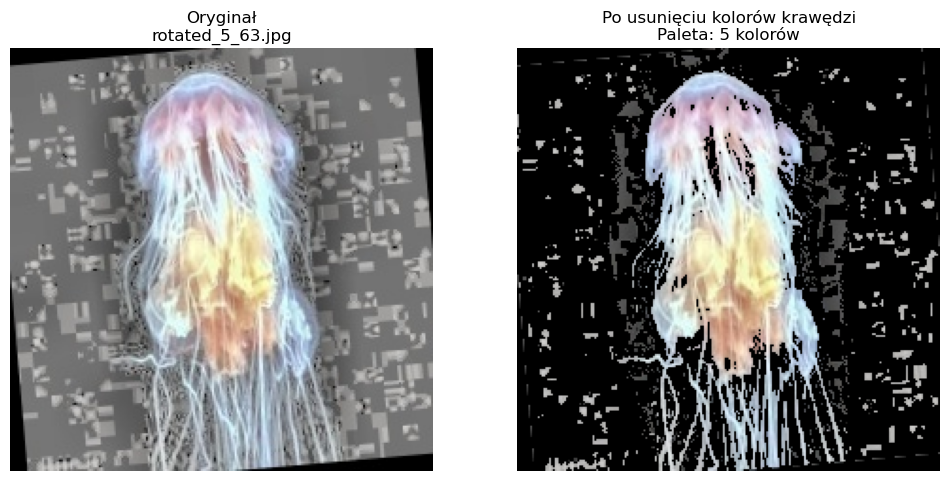

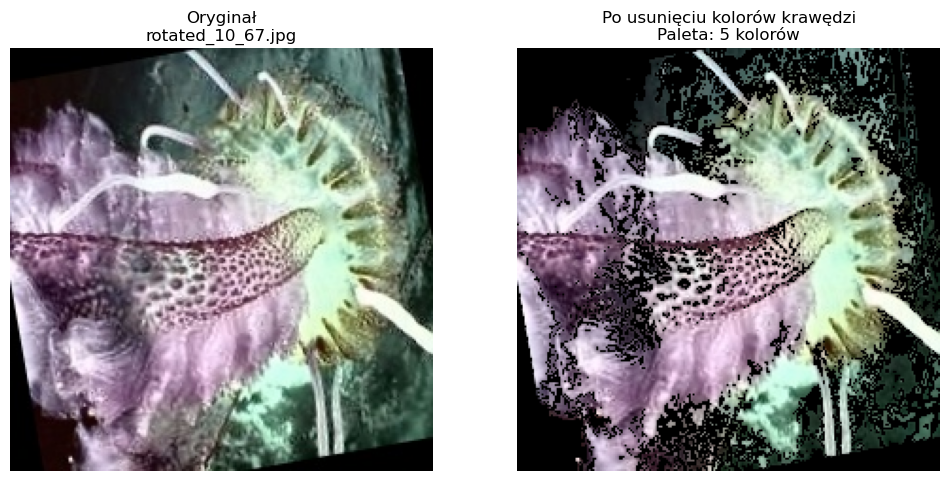

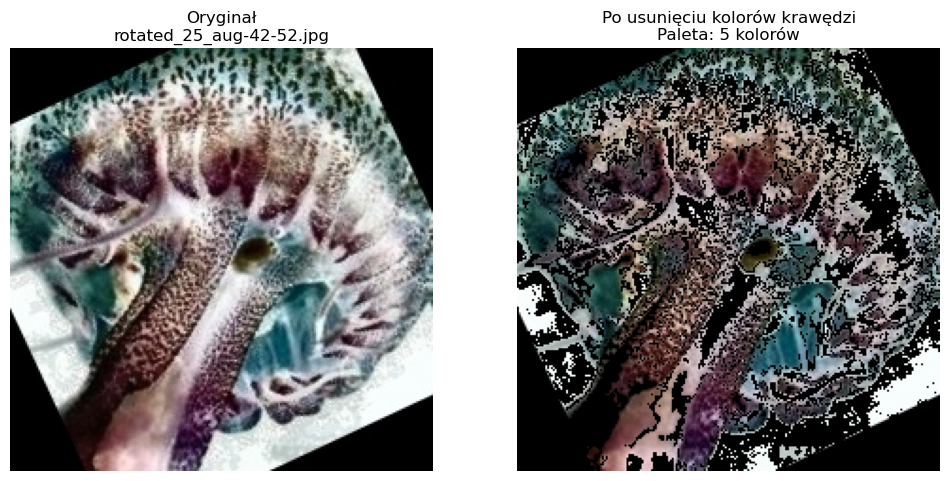

In [65]:
import cv2
import numpy as np
from pathlib import Path
import random
import matplotlib.pyplot as plt

def find_image_paths(base_dir, extensions=['.jpg', '.jpeg', '.png']):
    base = Path(base_dir)
    return [p for p in base.rglob('*') if p.suffix.lower() in extensions]

def extract_palette(image, k=5):
    # image w BGR uint8
    pixels = image.reshape(-1, 3)
    pixels = np.float32(pixels)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    counts = np.bincount(labels.flatten())
    # sortuj malejąco po liczebności
    sorted_idxs = np.argsort(-counts)
    centers = centers[sorted_idxs]
    counts = counts[sorted_idxs]

    return centers.astype(int), counts

def get_edge_colors(image, palette, edge_width=10, max_colors_to_remove=3):
    h, w = image.shape[:2]
    edges = np.zeros_like(image)
    edges[:edge_width, :, :] = image[:edge_width, :, :]
    edges[-edge_width:, :, :] = image[-edge_width:, :, :]
    edges[:, :edge_width, :] = image[:, :edge_width, :]
    edges[:, -edge_width:, :] = image[:, -edge_width:, :]

    edges_pixels = edges.reshape(-1, 3)

    def closest_color(pixel):
        dists = np.linalg.norm(palette - pixel, axis=1)
        return np.argmin(dists)

    indices = np.array([closest_color(px) for px in edges_pixels if np.any(px != 0)])
    if len(indices) == 0:
        return []

    unique, counts = np.unique(indices, return_counts=True)
    sorted_idxs = unique[np.argsort(-counts)]

    # TUTAJ wybieramy tylko max_colors_to_remove najczęstszych kolorów
    return sorted_idxs[:max_colors_to_remove].tolist()


def remove_edge_colors(image, palette, colors_to_remove, tolerance=30):
    img_lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    result = image.copy()
    mask = np.zeros(image.shape[:2], dtype=bool)

    for cidx in colors_to_remove:
        color_bgr = palette[cidx]
        color_lab = cv2.cvtColor(np.uint8([[color_bgr]]), cv2.COLOR_BGR2LAB)[0,0]

        dist = np.linalg.norm(img_lab.astype(np.float32) - color_lab.astype(np.float32), axis=2)
        close_mask = dist < tolerance
        mask = mask | close_mask

    result[mask] = 0
    return result

def process_and_show_images(folder_path, k_colors=5, edge_width=10, tolerance=20):
    image_paths = find_image_paths(folder_path)
    chosen = random.sample(image_paths, 5)

    for path in chosen:
        img = cv2.imread(str(path))
        if img is None:
            print(f"Nie można wczytać: {path}")
            continue

        palette, counts = extract_palette(img, k=k_colors)
        edge_colors_idx = get_edge_colors(img, palette, edge_width=edge_width)
        cleaned = remove_edge_colors(img, palette, edge_colors_idx, tolerance=tolerance)

        # Wyświetl oryginał i wynik
        fig, axs = plt.subplots(1,2, figsize=(12,6))
        axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[0].set_title(f'Oryginał\n{path.name}')
        axs[0].axis('off')

        axs[1].imshow(cv2.cvtColor(cleaned, cv2.COLOR_BGR2RGB))
        axs[1].set_title(f'Po usunięciu kolorów krawędzi\nPaleta: {k_colors} kolorów')
        axs[1].axis('off')

        plt.show()

# Uruchom:
process_and_show_images("DATA/Rotated_Klasteryzacja/Train")


In [ ]:
#wybieram sposób 2. wydaje mi się być najlepszym i najfajniejszym 

In [4]:
import os
import cv2
import numpy as np

def process_folder_cutouts(src_root, dst_root, color_thresh=30):
    for dirpath, dirnames, files in os.walk(src_root):
        # Tworzymy odpowiednią ścieżkę w folderze docelowym
        relative_path = os.path.relpath(dirpath, src_root)
        dst_dir = os.path.join(dst_root, relative_path)
        os.makedirs(dst_dir, exist_ok=True)

        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png')):
                src_file = os.path.join(dirpath, f)
                dst_file = os.path.join(dst_dir, f)

                # Uruchamiamy funkcję wycinającą
                orig_img, cut_img = cutout_by_color_distance(src_file, color_thresh=color_thresh)

                # cut_img to numpy array - zapisujemy jako plik PNG (zachowując alfa lub bez, w zależności od tego jak masz)
                # Jeśli cut_img ma 3 kanały (RGB), zapisz bez alfa, jeśli 4 (RGBA), zapisz z alfa
                if cut_img.shape[2] == 4:
                    cv2.imwrite(dst_file, cv2.cvtColor(cut_img, cv2.COLOR_RGBA2BGRA))
                else:
                    cv2.imwrite(dst_file, cv2.cvtColor(cut_img, cv2.COLOR_RGB2BGR))

                print(f"Zapisano: {dst_file}")

# Przykład wywołania
src_folder = r"DATA/Rotated_Klasteryzacja"
dst_folder = r"DATA/rotated-cutted"
process_folder_cutouts(src_folder, dst_folder, color_thresh=30)


Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_02.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_11.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_12.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_19.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_28.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_34.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_37.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-22-29.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-24-31.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-33-40.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-43-03.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-5-06.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfish\rotated_10_aug-58-22.jpg
Zapisano: DATA/rotated-cutted\test\barrel_jellyfi